==============================================================================================
## Practicum 4: Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

In this laboratory we will treat the following main topics:

1) Template matching
    - Normalized Cross-correlation
    - Application to object (eye) detection 

2) Image Descriptors: "Sliding window" and HOG image descriptor
   - Application to object (car) detection

3) Image matching (recognition by correspondance) based on feature extraction (ORB)
    - Application to object (logo) detection
    
In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

All code should be commented in English. Answers of the questions and comments on the exercises should be given in English too.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 4.1 Template matching

4.1.1 Given the image 'einstein.png' and the template 'eye.png', detect the location of the template in the image comparing the use of:
- euclidean distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Hint: you can take as an example, the template matching on the [coin exercise](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_template.html#sphx-glr-auto-examples-features-detection-plot-template-py) in skimage.
Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

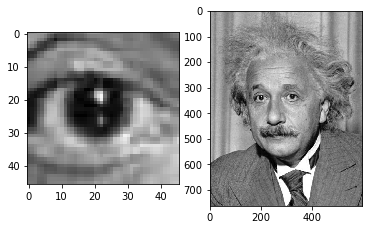

In [4]:
from skimage import io
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

plt.subplot(1,2,1)
eye=io.imread('./images/eye.png')
plt.imshow(eye)

plt.subplot(1,2,2)
einstein=io.imread('./images/einstein.png')
plt.imshow(einstein)

plt.show()


In [5]:
''' Visualization and template matching functions definition '''


' Visualization and template matching functions definition '

In [6]:
# This functions are used to print images in different formats
def print_1x2(imatge,imatge_despres, tit, tit1):
    fig, axarr = plt.subplots(1,2)
    fig.set_size_inches(25,10)
    
    axarr[0].imshow(imatge,cmap='gray')
    axarr[0].set_title(tit)
    axarr[0].xaxis.set_visible(False)
    axarr[0].yaxis.set_visible(False)
    
    axarr[1].imshow(imatge_despres, cmap='gray')
    axarr[1].set_title(tit1)
    axarr[1].xaxis.set_visible(False)
    axarr[1].yaxis.set_visible(False)
    plt.show()

    
def print_1x1(imatge,title):
    fig, axarr = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    
    axarr.imshow(imatge,cmap='gray')
    axarr.set_title(title)
    axarr.xaxis.set_visible(False)
    axarr.yaxis.set_visible(False)

    plt.show()

def print_1x3(imatge,imatge1, imatge2, title, title1, title2):
    fig, axarr = plt.subplots(1,3)
    fig.set_size_inches(20,10)
    
    #imatge
    axarr[0].imshow(imatge,cmap='gray')
    axarr[0].set_title(title)
    axarr[0].xaxis.set_visible(False)
    axarr[0].yaxis.set_visible(False)
    
    axarr[1].imshow(imatge1, cmap='gray')
    axarr[1].set_title(title1)
    axarr[1].xaxis.set_visible(False)
    axarr[1].yaxis.set_visible(False)
    
    axarr[2].imshow(imatge2, cmap='gray')
    axarr[2].set_title(title2)
    axarr[2].xaxis.set_visible(False)
    axarr[2].yaxis.set_visible(False)
    plt.show()

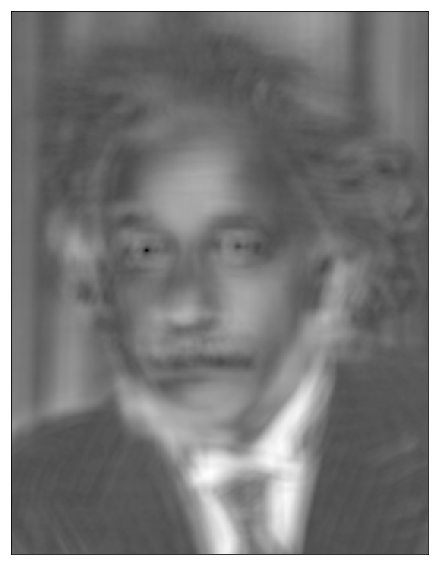

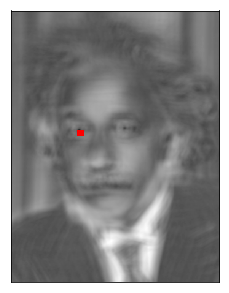

In [10]:
from skimage.color import rgb2gray

# This function implements the template search using a sliding window
def find_template(im, patch):
    
    # we create an array with zeros, with the shape of the resulting image we are looking for
    dark_image = np.zeros([im.shape[0]-patch.shape[0],im.shape[1]-patch.shape[1]]) 
    
    # we iterate over each pixel of the image
    for i in range(dark_image.shape[0]):
        for j in range(dark_image.shape[1]):
            # and we calculate the norm of the difference between the sliding window and the template(patch)
            dark_image[i,j] = np.linalg.norm(im[i:(i+patch.shape[0]),j:(j+patch.shape[1])]-patch)

    return dark_image

# we create copies of the images
eye_gray = eye.copy()
einstein_gray = einstein.copy()

# transform them into grayscale
eye_gray = rgb2gray(eye_gray)
einstein_gray = rgb2gray(einstein_gray)

# and then we execute the find_template function
image = find_template(einstein_gray, eye_gray)
# and we print the result
print_1x1(image, " ")

# we can look at the position where the value is minimum, and it should correspond to the patch psotion
ij = np.unravel_index(np.argmin(image), image.shape)
x, y = ij[::-1]

fig, axarr = plt.subplots(1,1)
fig.set_size_inches(5,5)
axarr.imshow(image,cmap='gray')
axarr.xaxis.set_visible(False)
axarr.yaxis.set_visible(False)
#we add a square at the eye position, to show where the template is detected
rect = plt.Rectangle((x, y), 10, 10, edgecolor='r', facecolor='none')
rect.set_linewidth(3)
axarr.add_patch(rect)
plt.show()



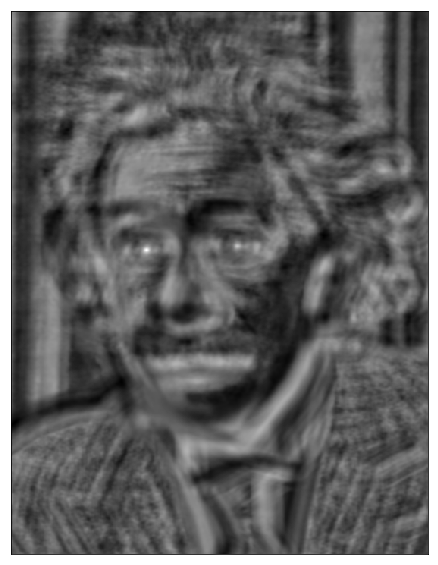

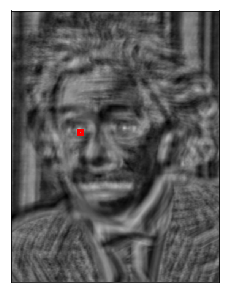

In [11]:
from skimage.feature import match_template

eye_gray = eye.copy()
einstein_gray = einstein.copy()

eye_gray = rgb2gray(eye_gray)
einstein_gray = rgb2gray(einstein_gray)

# we do the same that we did in the last entry, but now we use the already implemented
# fuction match_template, that calculates the distance using the normalized cross-correlation
image_final = match_template(einstein_gray,eye_gray)
print_1x1(image_final, "")


ij = np.unravel_index(np.argmax(image_final), image_final.shape)
x, y = ij[::-1]

fig, axarr = plt.subplots(1,1)
fig.set_size_inches(5,5)
axarr.imshow(image_final,cmap='gray')
axarr.xaxis.set_visible(False)
axarr.yaxis.set_visible(False)

rect = plt.Rectangle((x, y), 10, 10, edgecolor='r', facecolor='none')
rect.set_linewidth(3)
axarr.add_patch(rect)
plt.show()

4.1.2 How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? To this purpose, read the images "einstein_br.png" and "einstein_mask.png".

Visualize the normalized cross-correlation image between the template and the image as well as this very same image in a binarized form in order to show where is the minimal distance between the template and the image. 
* How does the minimum distance between the template and the image change? 
* What are the minimal distance pixels in the correlation images? 
* What are the distances between the template and the image around the eyes of the image? 

Use titles of the figures to explain what is displayed.


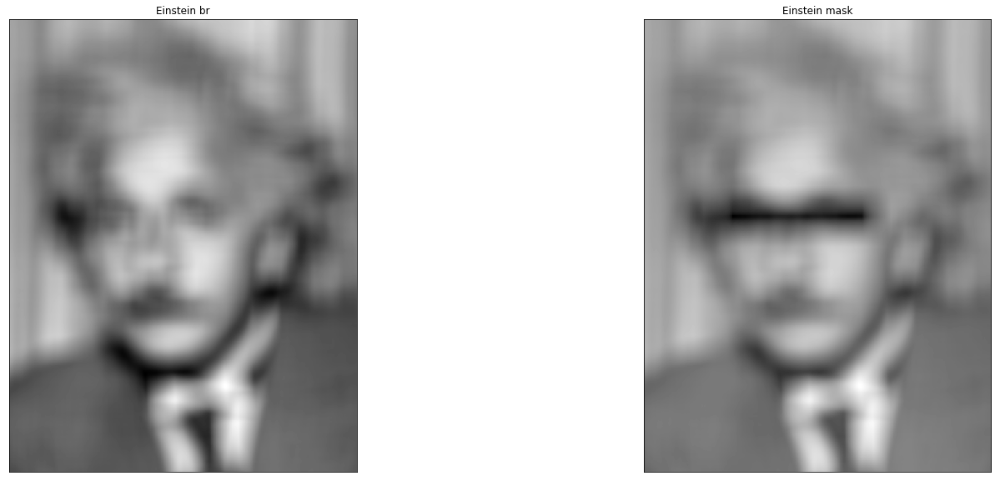

In [12]:
from skimage import img_as_float
# now we are working with the images with brightness and the einstein with mask
einstein_br = io.imread('./images/einstein_br.png')
einstein_mask = io.imread('./images/einstein_mask.png')

eye_gray = eye.copy()
einstein_br_gray = einstein_br.copy()

einstein_mask_gray = einstein_mask.copy()

eye_gray = rgb2gray(eye_gray)
einstein_br_gray = rgb2gray(einstein_br_gray)
einstein_mask_gray = rgb2gray(einstein_mask_gray)

# we use our find_template function
image = find_template(einstein_br_gray, eye_gray)
image1 = find_template(einstein_mask_gray, eye_gray)
print_1x2(image, image1, "Einstein br", "Einstein mask")




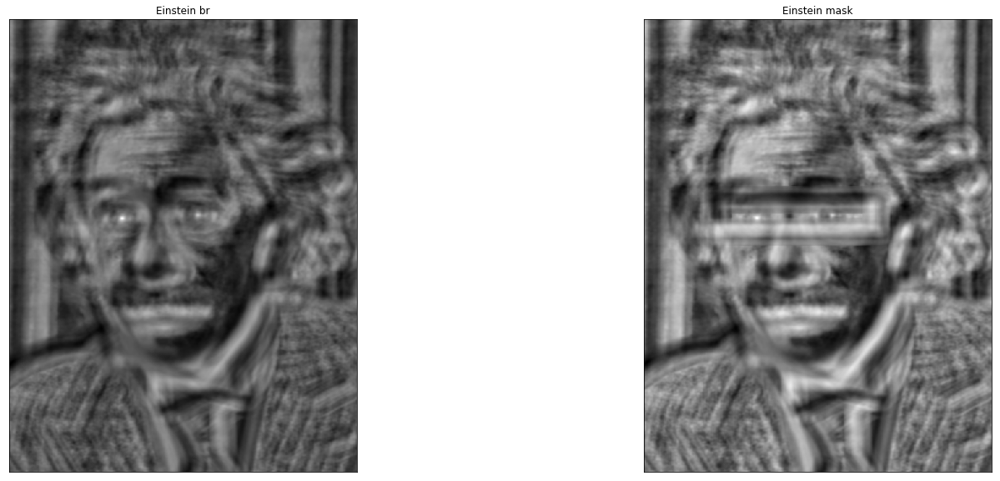

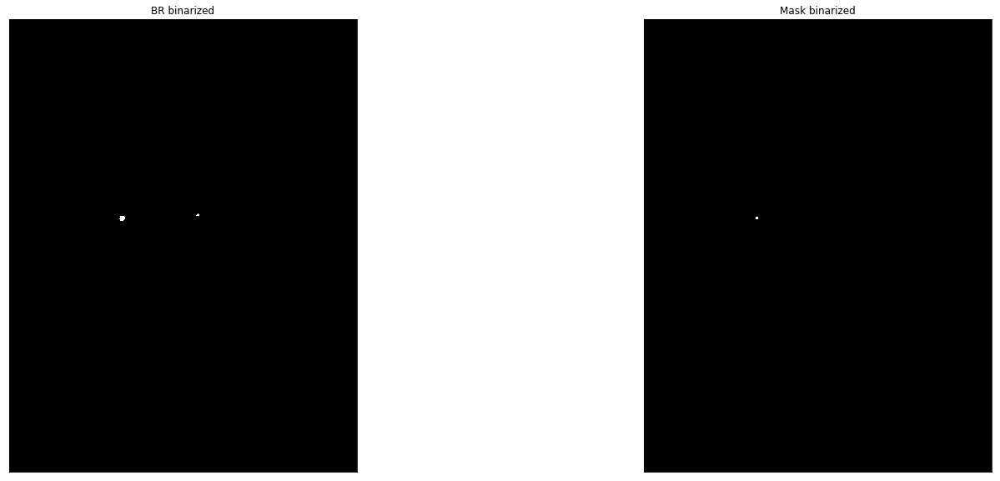

In [13]:
# we also do the same but with match_template
image = match_template(einstein_br_gray,eye_gray)
image1 = match_template(einstein_mask_gray,eye_gray)
print_1x2(image, image1, "Einstein br", "Einstein mask")

# and we binarize the result to find the positions where the template is located
image_bin=np.zeros([image.shape[0],image.shape[1]])
# we save the maximum value of the image, this value will correspond to the zone with more proximity to the template
valor =image.max()
# then we set the bin image values to 1, using a threshold to show te corresponding pixels of the eye
image_bin[image > valor-0.45] = 255

# we do the same with the image1
image1_bin=np.zeros([image1.shape[0],image1.shape[1]])
valor =image1.max()
image1_bin[image1 > valor-0.1] = 255

# we print the result
print_1x2(image_bin, image1_bin, "BR binarized", "Mask binarized")


* How does the minimum distance between the template and the image change? 
**If the image has a higher contrast, the maximum value of the resulting image(the value will correspond to the position with minimum distance) will be greater.**
* What are the minimal distance pixels in the correlation images? 
**The minimal distance pixels are the values with higher values in the resulting image. To get this pixels, we can add a threshold depending on the image, to determine which pixels are part of the "patch".**
* What are the distances between the template and the image around the eyes of the image? 
**The distance around the eyes of the image should have a lesser value than the values where the eyes are located, as the distance will be greater, and then, its intensity value in the resulting image will be lower.**


4.1.3 How does the result of the template matching changes if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the 'eye_br.png' template.

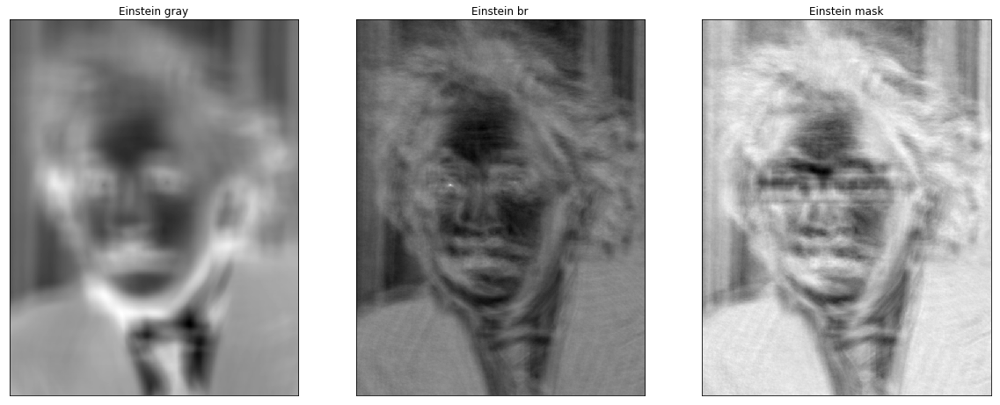

In [140]:
eye_br = io.imread('./images/eye_br.png')
eye_br_gray = rgb2gray(eye_br)

# we calculate the images with the new patch, and we print the result
image = find_template(einstein_gray,eye_br_gray)
image1 = find_template(einstein_br_gray, eye_br_gray)
image2 = find_template(einstein_mask_gray, eye_br_gray)
print_1x3(image, image1, image2, "Einstein gray", "Einstein br", "Einstein mask")

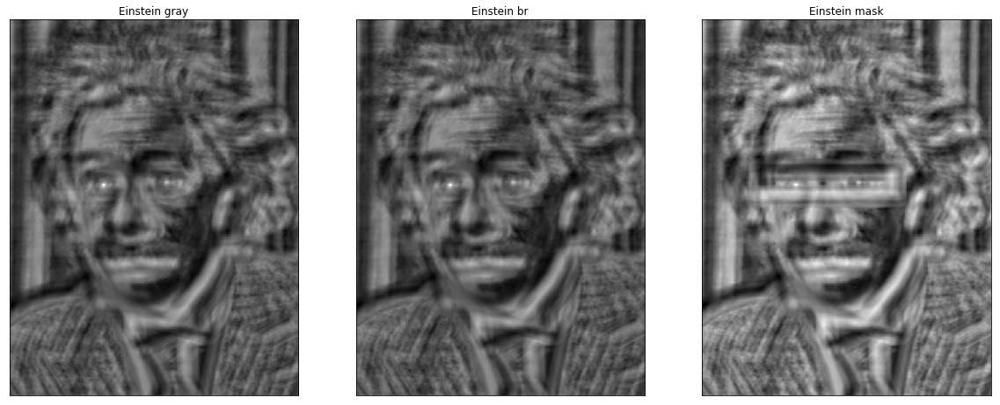

In [141]:
# we do the same using match_template, to analyze the results later
image = match_template(einstein_gray,eye_br_gray)
image1 = match_template(einstein_br_gray,eye_br_gray)
image2 = match_template(einstein_mask_gray,eye_br_gray)
print_1x3(image, image1, image2, "Einstein gray", "Einstein br", "Einstein mask")

**As the values of the template will be on a different scale from the original image, this will mean that the distance values will be greater(with the euclidean distance technique). Using the normalized cross-correlation this won't affect the result, its a matter of the way we calculate the distances.**

4.1.4 Check how the result changes if the template is rotated. Visualize the template and its rotation by 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.
Help: use the function rotate() in skimage.transform

Comment what is the template matching process, what advantages and disadvantages it has, how sensible is to image deformation in photometric and spatial dimensions, what parameters it has and which measure for image comparisons works better.

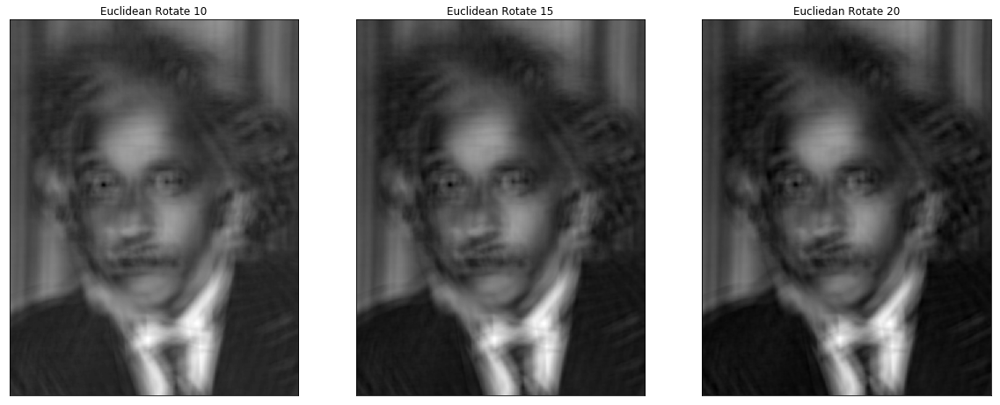

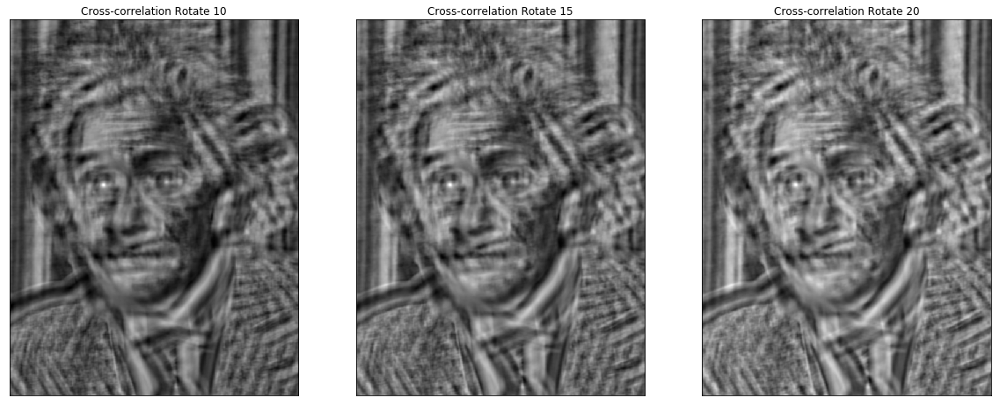

In [143]:
from skimage.transform import rotate
# we import the eye image and transform it to grayscale
eye=io.imread('./images/eye.png')
eye = rgb2gray(eye)
# we save different rotated images of the eye
eye_rotated_10 = rotate(eye,10)
eye_rotated_15 = rotate(eye,15)
eye_rotated_20 = rotate(eye,20)

# and we look for the template using the euclidean distance
image_euclidean_10 = find_template(einstein_gray,eye_rotated_10)
image_euclidean_15 = find_template(einstein_gray,eye_rotated_15)
image_euclidean_20 = find_template(einstein_gray,eye_rotated_20)

print_1x3(image_euclidean_10, image_euclidean_15, image_euclidean_20, "Euclidean Rotate 10", 
          "Euclidean Rotate 15", "Eucliedan Rotate 20")
# and using the normalized cross-correlation
image_xcorrel_10 = match_template(einstein_gray,eye_rotated_10)
image_xcorrel_15 = match_template(einstein_gray,eye_rotated_15)
image_xcorrel_20 = match_template(einstein_gray,eye_rotated_20)

print_1x3(image_xcorrel_10, image_xcorrel_15, image_xcorrel_20, "Cross-correlation Rotate 10", 
          "Cross-correlation Rotate 15", "Cross-correlation Rotate 20")


**The template matching process consists in looking for a template image coincidence in another image. The advantage of this technique is that if we want to find an exact similarity point in an image, this will solve our problem, but its problem is that this is really sensible to image deformation, as we are commparing pixel by pixel, to find the most similarity between template and image. 
It is sensible to image deformation in both photometric and spatial dimensions, but the photometric deformation problem is less important depending on the way we calculate the distances. 
We think that the best way to compare template-image is using the normalized cross-correlation, with the photometric and spatial dimensions between the template and the image as similar as possible.**

# 4.2 Histogram of Oriented Gradients


The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image 'car_template.png' and the folder 'cars', apply the HOG descriptor in order to detect where there is a car in the images in the folder 'car'. To this purpose, apply the "sliding window" technique. The algorithm can be:

a) Read the car template ('car_template.png') and obtain its HOG descriptor. Visualize it. [Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py) 

b) Read images from the folder "car", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the car template. 

c) Visualize the location in the image that is the most similar to the car template. What distance will you use to compare both HOG descriptors of the car template and the image region? Compare if there is any difference in their results. 

d) Compute in how many images the cars were detected correctly and discuss the algorithm failures. What do you think can be the reasons for the failure?

Hint: the HOG detector function is in the skimage.feature library. 

If you want to accelerate algorithm execution, you can apply the sliding window with a step of X pixels (e.g. X=5).

Discuss what is the HOG descriptor, what are the parameters of the algorithm, which are the optimal values for the car detection testing several values of the parameters up to your criterion. Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

In [11]:
''' Visualization and HOG functions definition '''


' Visualization and HOG functions definition '

In [15]:
def print_1x1(imatge,title):
    fig, axarr = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    
    #imatge
    axarr.imshow(imatge,cmap='gray')
    axarr.set_title(title)
    axarr.xaxis.set_visible(False)
    axarr.yaxis.set_visible(False)

    plt.show()

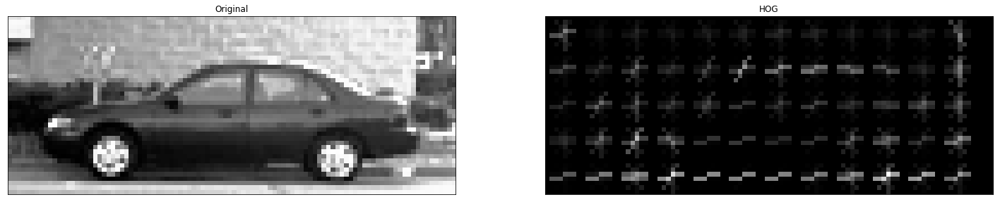

In [16]:
from skimage.feature import hog
from skimage.color import rgb2gray

# we import the car template image
car_template = io.imread('./images/car_template.png')
# save it as grayscale
car_template_grayscale = rgb2gray(car_template)
# we calculate the histogram of gradients of the image using hog, with parameters determined by ourselves
hog_image, im = hog(car_template_grayscale,orientations=5, pixels_per_cell=(8, 8), cells_per_block=(3, 3),
                    visualise=True, block_norm = 'L2-Hys')

print_1x2(car_template, im, "Original", "HOG")

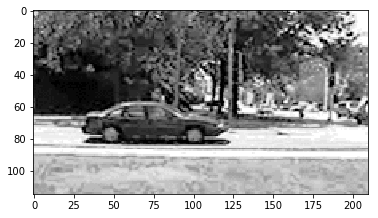

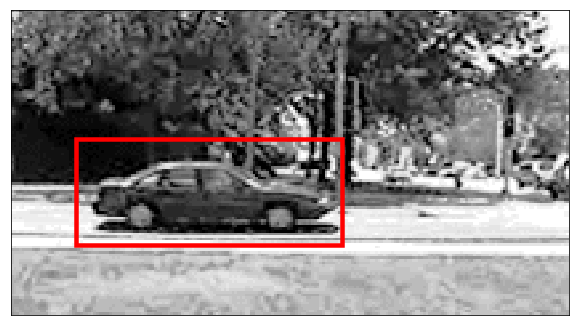

In [18]:
from skimage.feature import match_template

car_template1 = io.imread('./images/TestImages/test-0.pgm')
plt.imshow(car_template1, cmap = 'gray')
plt.show()

car_template_grayscale1 = rgb2gray(car_template1)

hog_image1, im1 = hog(car_template_grayscale1,orientations=5, pixels_per_cell=(8, 8), cells_per_block=(3, 3),
                    visualise=True, block_norm = 'L2-Hys')
# using the obtained hogs, we compare the HOGs from both images, using the sliding window method, to look for the 
# maximum similarities between the hogs. We use the normalized cross-correlation
result = match_template(im1, im)
# once calculated the new image, we get the position of minimum distance between the two hogs
# and we add a square at the position found
ij = np.unravel_index(np.argmax(result), result.shape)
x, y = ij[::-1]

fig, axarr = plt.subplots(1,1)
fig.set_size_inches(10,10)
axarr.imshow(car_template1,cmap='gray')
axarr.xaxis.set_visible(False)
axarr.yaxis.set_visible(False)

hcar, wcar = car_template.shape
rect = plt.Rectangle((x, y), wcar, hcar, edgecolor='r', facecolor='none')
rect.set_linewidth(4.5)
axarr.add_patch(rect)
plt.show()

In [20]:
# this function will be used to extract the hog from an image
def find_hog(image):
    image_grayscale = rgb2gray(image)

    hog_image, im = hog(image_grayscale,orientations=5, pixels_per_cell=(8, 8), cells_per_block=(3, 3),
                        visualise=True, block_norm = 'L2-Hys')
    return im

In [21]:
# this function will be used to compare a template hog with an image, this will calculate the image hog, but 
#this needs the template hog as parameter
def find_template_rectangle(image, template_hog):
         
    image_grayscale = rgb2gray(image)
    hog_image, im1 = hog(image_grayscale,orientations=5, pixels_per_cell=(8, 8), cells_per_block=(3, 3),
                        visualise=True, block_norm = 'L2-Hys')
    
    # using the obtained hogs, we compare the HOGs from both images, using the sliding window method, to look for the 
    # maximum similarities between the hogs. We use the normalized cross-correlation
    result = match_template(im1, template_hog)
    
    # once calculated the new image, we get the position of minimum distance between the two hogs
    # and we add a square at the position found
    ij = np.unravel_index(np.argmax(result), result.shape)
    x, y = ij[::-1]

    fig, axarr = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    axarr.imshow(image,cmap='gray')
    axarr.xaxis.set_visible(False)
    axarr.yaxis.set_visible(False)

    hcar, wcar = template_hog.shape
    rect = plt.Rectangle((x, y), wcar, hcar, edgecolor='r', facecolor='none')
    rect.set_linewidth(4.5)
    axarr.add_patch(rect)
    plt.show()

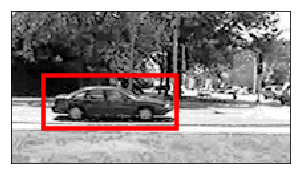

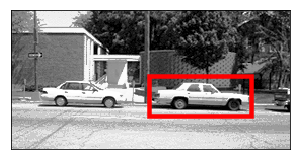

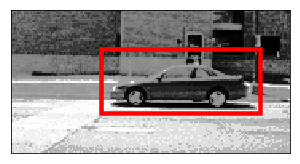

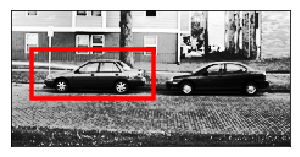

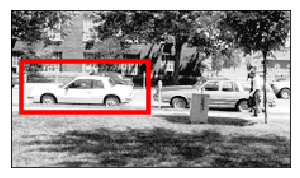

...

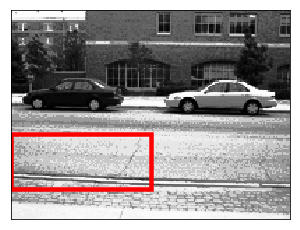

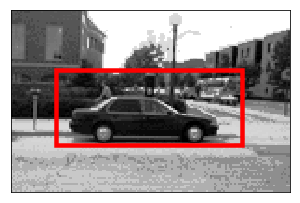

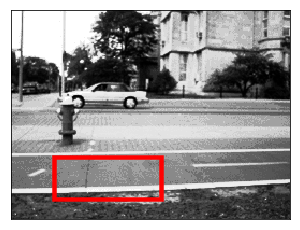

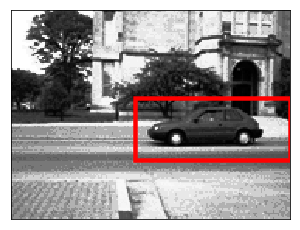

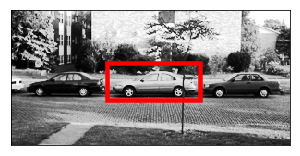

KeyboardInterrupt: 

In [22]:
# WARNING: this will plot 150 images
from skimage.feature import hog
from skimage.color import rgb2gray

# we import the car template
car_template = io.imread('./images/car_template.png')
# and find its HOG
im = find_hog(car_template)

# we import the car images as an image collection
ic = io.ImageCollection('images/TestImages/*.pgm')
# and we look for cars in each image of the image collection
for i in ic:
    find_template_rectangle(i,im)

**To compare both HOG descriptors we have used the normalized cross-correlation, as it has given us the best results(we've also tried with euclidean distance, and it didnt aim correctly at the position of the car).**

**As we can see in the images, there's a high "hit rate" on finding the car position correctly. Still there are different images where the process cant detect the car correctly. We think that the reasons of the failure are:**

    -The images colour variance is really low, so the HOG descriptor is not good enough to determine where a car is.
    
    -There are two cars in the image and we are just looking for one.
    
    -The car is hidden by a tree, street forniture..., so it's not detected correctly.
 
**The HOG descriptor, Histogram of Gradients, is the histogram of the orientation gradients of an image. It is calculated by dividing the image into different cells, to calculate the gradient orientation of each cell and then joining different cells into blocks. This way, we can obtain an histogram with the different gradient orientations, and we can compare this descriptor, with the HOG descriptors of other images. 
The parameters of the HOG descriptor algorithm are the size of the cells, and the number of cells per block. Changing this values will modify the quantity of diferent gradient orientations that we will obtain from the image. With our criterion, we think that 64 pixels per cell, and 9 cells per block are good values to compare the car template and images.**

**Yes, the advantage of the HOG-based detection is that it's not orientation dependant, and it is focused on color gradients instead of colors, this means that we will not have any trouble if the image is green or blue for example, as we are focusing the variance of colour and not the values of the pixels by themselves. **


# 4.3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

In theory classes, we saw two feature extraction methods: SIFT and ORB. Let us focus on ORB.

**4.3.1** Check if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

a) Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks6.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. Define the algorithm in terms of functions in order to be able to apply it on different images. Comment the code in detail.

Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.

In [28]:
''' Visualization and ORB functions definition '''


' Visualization and ORB functions definition '

61


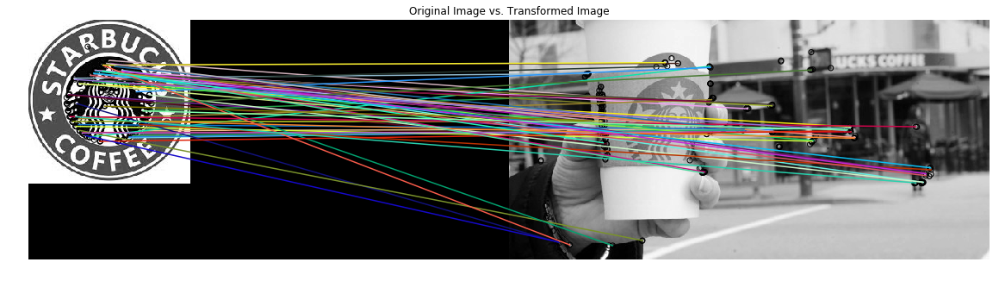

In [30]:
from skimage.feature import (match_descriptors, corner_harris,
                             corner_peaks, ORB, plot_matches)
from skimage.color import rgb2gray


# we import the 2 images
starbucks = io.imread('./images/starbucks.jpg')
starbucks_6 = io.imread('./images/starbucks6.jpg')

# and we save them as grayscale
starbucks_grayscale = rgb2gray(starbucks)
starbucks_6_grayscale = rgb2gray(starbucks_6)

# this function will calculate and show the ORB descriptors
def ORB_function(image1, image2):
    # this will be our descriptor extractor, using 200 keypoints as parameter
    descriptor_extractor = ORB(n_keypoints=200)

    # we execute the detect and extract function for the image1
    descriptor_extractor.detect_and_extract(image1)
    # and we save the keypoints and the descriptors obtained
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors
    # we do the same for the second image
    descriptor_extractor.detect_and_extract(image2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors
    
    # and we call match_descriptors to compare both images descriptors, and then see its correlation
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
    # the number of matches can be used as a value to determine the equality of images
    print(len(matches12))
    
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    fig.set_size_inches(20,10)
    plt.gray()

    #we use the (implemented at the end of this document) plot_matches_aux instead of plot_matches
    plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Original Image vs. Transformed Image")


    plt.show()
# we test the implemented ORB function
ORB_function(starbucks_grayscale, starbucks_6_grayscale)


b) Repeat the experiment comparing the "starbucks.jpg" image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when the algorithm works best. 

84


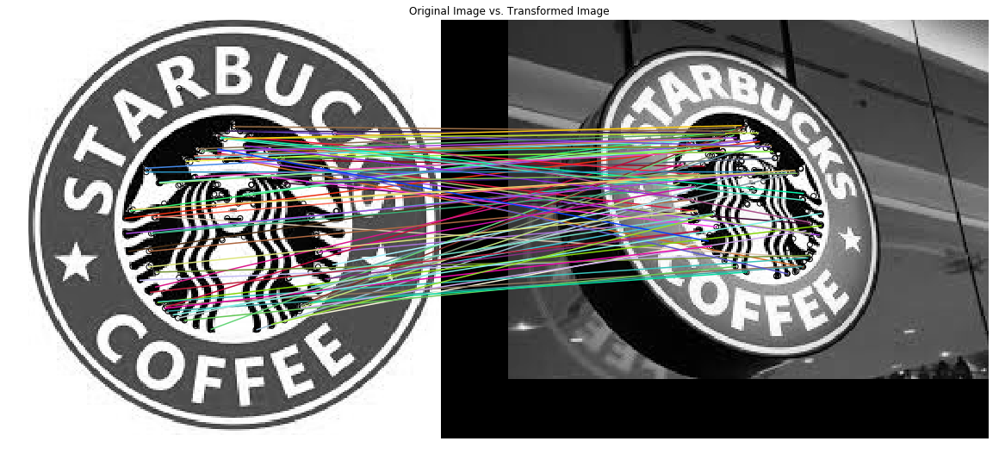

76


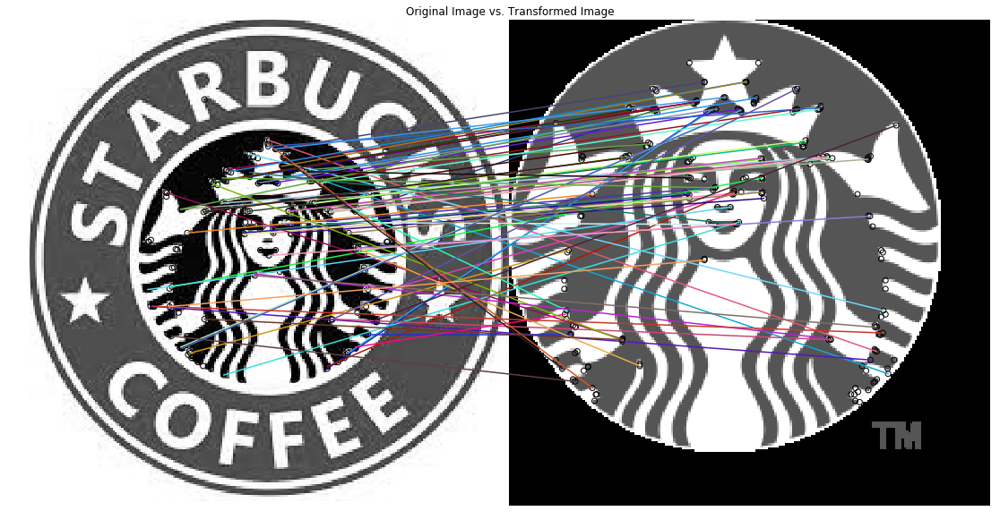

72


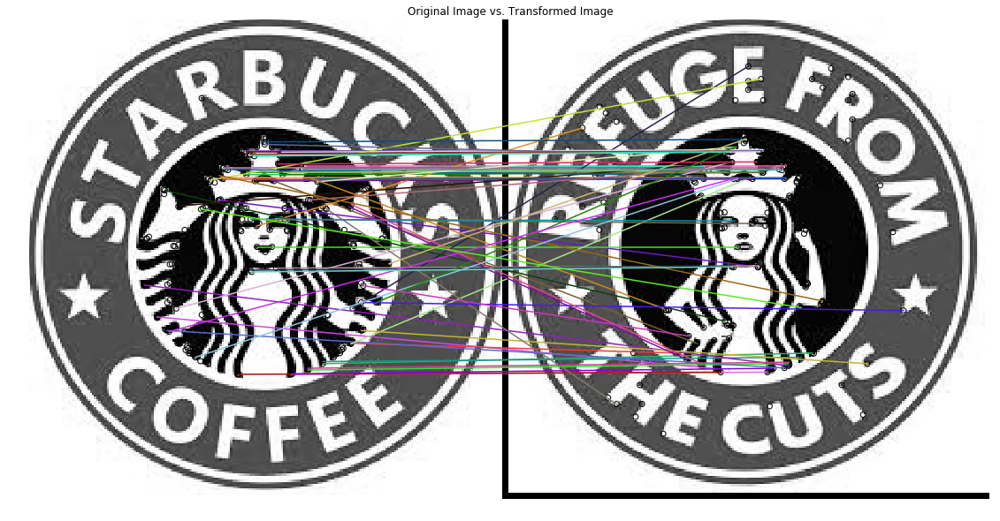

69


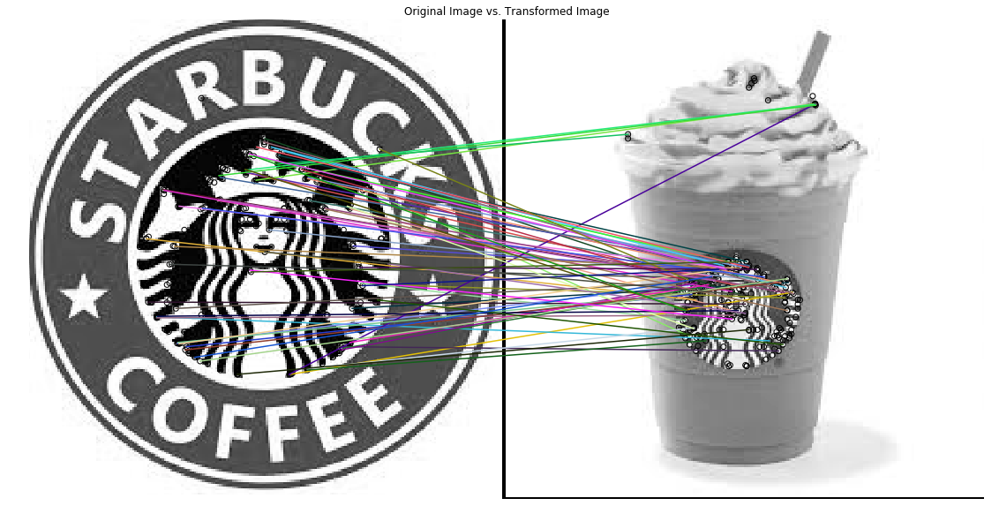

61


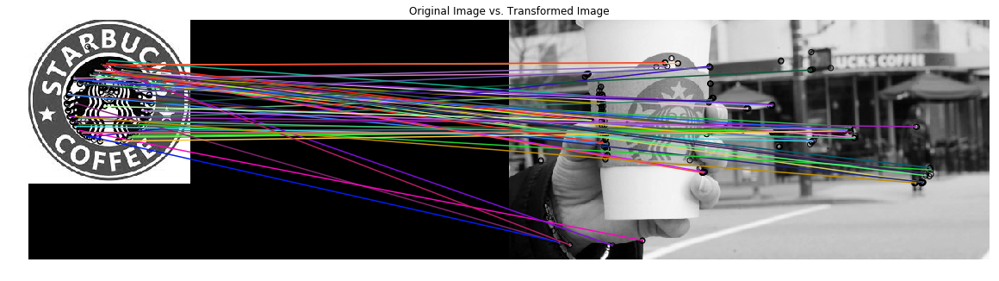

In [31]:
# we import the different images and transform them to grayscale
starbucks = io.imread('./images/starbucks.jpg')
starbucks_grayscale = rgb2gray(starbucks)

starbucks_2 = io.imread('./images/starbucks2.png')
starbucks_2_grayscale = rgb2gray(starbucks_2)

starbucks_4 = io.imread('./images/starbucks4.jpg')
starbucks_4_grayscale = rgb2gray(starbucks_4)

starbucks_5 = io.imread('./images/starbucks5.png')
starbucks_5_grayscale = rgb2gray(starbucks_5)

starbucks_6 = io.imread('./images/starbucks6.jpg')
starbucks_6_grayscale = rgb2gray(starbucks_6)

starbucks_cup = io.imread('./images/starbucksCup.jpg')
starbucks_cup_grayscale = rgb2gray(starbucks_cup)

# and we call to the orb function, the order of execution is sorted by the number of matched descriptors between the images
ORB_function(starbucks_grayscale, starbucks_4_grayscale)
ORB_function(starbucks_grayscale, starbucks_2_grayscale)
ORB_function(starbucks_grayscale, starbucks_5_grayscale)
ORB_function(starbucks_grayscale, starbucks_cup_grayscale)
ORB_function(starbucks_grayscale, starbucks_6_grayscale)



c) Repeate the experiment in (b): 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

Help: To do so, you can use the function given below as example:

import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)

or

tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)

In [32]:
from skimage import transform as tf

# this is the same as ORB_function, but it accepts another parameter rotationdegrees, that will correspond to the 
# degrees we want to rotate our image
def ORB_function_rotated(image1, image2, rotationdegrees):
    
    # we rotate the image
    img_rotated = tf.rotate(image1, rotationdegrees)
    
    #and do the same that's explained in the ORB_functio
    descriptor_extractor = ORB(n_keypoints=200)


    descriptor_extractor.detect_and_extract(img_rotated)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors

    descriptor_extractor.detect_and_extract(image2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors

    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
    print(len(matches12))
    
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    fig.set_size_inches(20,10)
    plt.gray()

    plot_matches_aux(ax, img_rotated, image2, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Original Image vs. Transformed Image")



    plt.show()

200


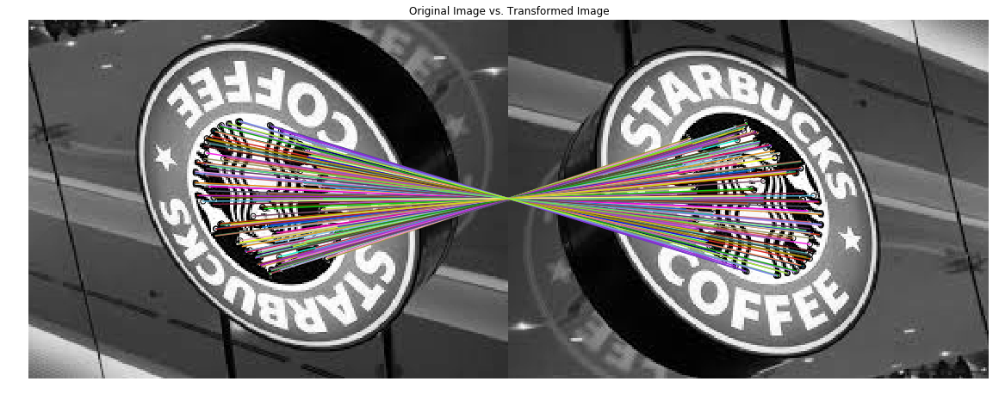

200


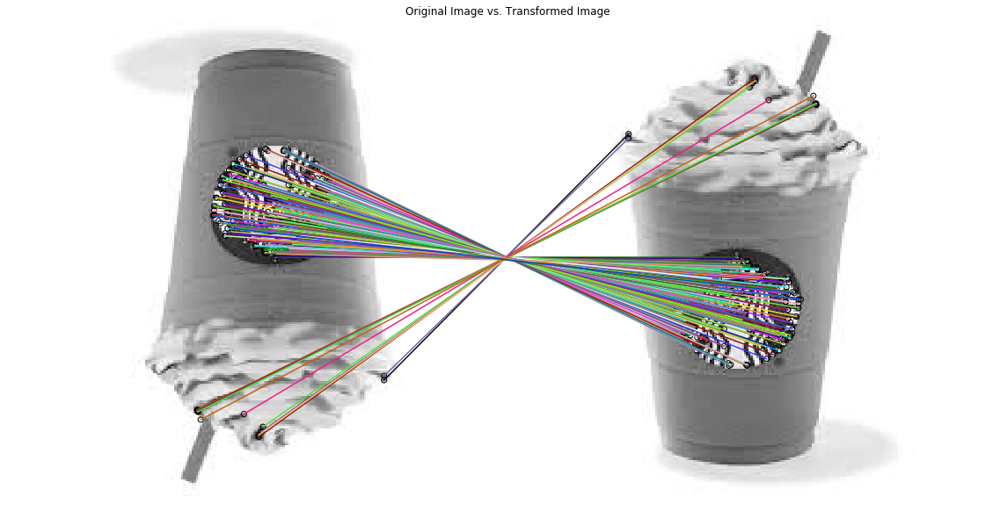

199


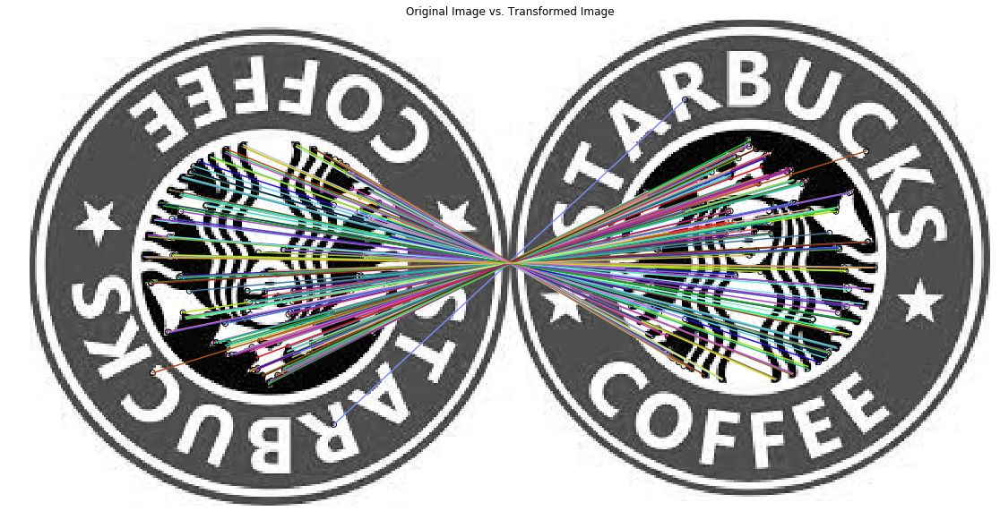

199


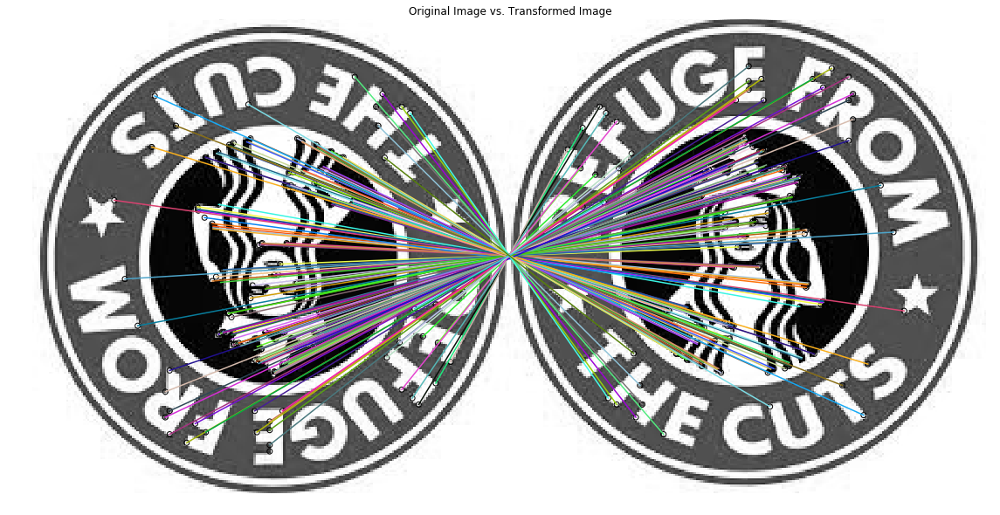

198


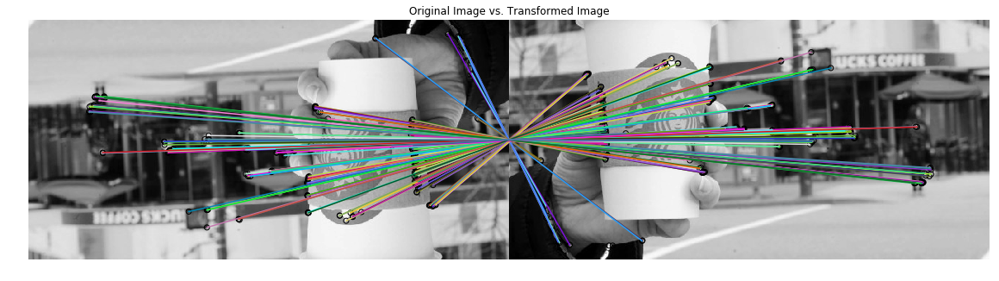

196


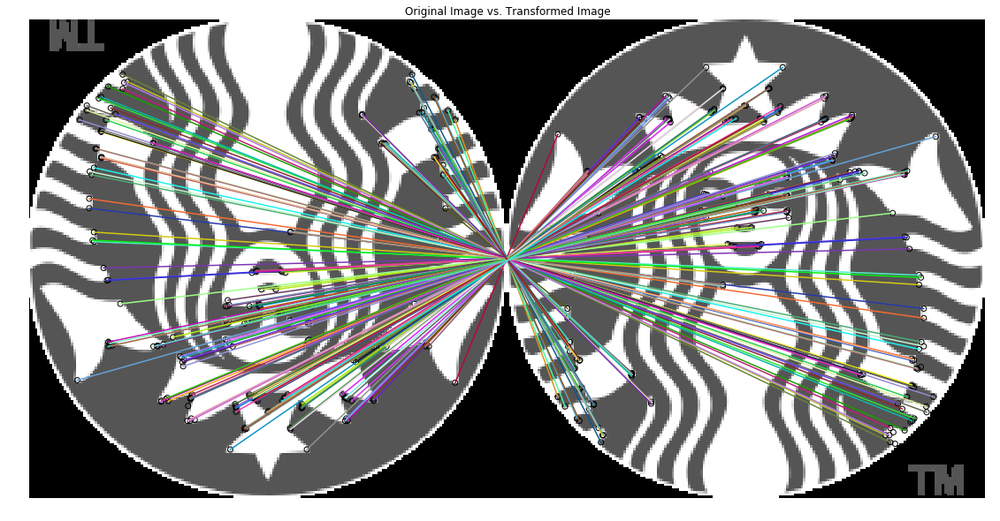

In [33]:
# we import the different images and transform them to grayscale
starbucks = io.imread('./images/starbucks.jpg')
starbucks_grayscale = rgb2gray(starbucks)

starbucks_2 = io.imread('./images/starbucks2.png')
starbucks_2_grayscale = rgb2gray(starbucks_2)

starbucks_4 = io.imread('./images/starbucks4.jpg')
starbucks_4_grayscale = rgb2gray(starbucks_4)

starbucks_5 = io.imread('./images/starbucks5.png')
starbucks_5_grayscale = rgb2gray(starbucks_5)

starbucks_6 = io.imread('./images/starbucks6.jpg')
starbucks_6_grayscale = rgb2gray(starbucks_6)

starbucks_cup = io.imread('./images/starbucksCup.jpg')
starbucks_cup_grayscale = rgb2gray(starbucks_cup)


# and we call to the orb function rotate, 
# the order of execution is sorted by the number of matched descriptors between the images
ORB_function_rotated(starbucks_4_grayscale, starbucks_4_grayscale, 180)
ORB_function_rotated(starbucks_cup_grayscale, starbucks_cup_grayscale, 180)
ORB_function_rotated(starbucks_grayscale, starbucks_grayscale, 180)
ORB_function_rotated(starbucks_5_grayscale, starbucks_5_grayscale, 180)
ORB_function_rotated(starbucks_6_grayscale, starbucks_6_grayscale, 180)
ORB_function_rotated(starbucks_2_grayscale, starbucks_2_grayscale, 180)


In [36]:
from skimage import transform as tf
# this function is also the same as the other 2 functions, but it also accepts a scaleValue to morph the image size
def ORB_function_rotated_scale(image1, image2, rotationdegrees, scalevalue): 
    img_rotated = tf.rotate(image1, rotationdegrees)
    # we resize the image with the given values
    tform = tf.AffineTransform(scale=(scalevalue, scalevalue), translation=(0, -25)) 
    img_transformed = tf.warp(img_rotated, tform)
    
    
    # we do the same as the other functions to look for the descriptors matches
    descriptor_extractor = ORB(n_keypoints=200)


    descriptor_extractor.detect_and_extract(img_transformed)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors

    descriptor_extractor.detect_and_extract(image2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors

    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
    print(len(matches12))

    fig, ax = plt.subplots(nrows=1, ncols=1)
    fig.set_size_inches(20,10)
    plt.gray()

    plot_matches_aux(ax, img_transformed, image2, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Original Image vs. Transformed Image")



    plt.show()

119


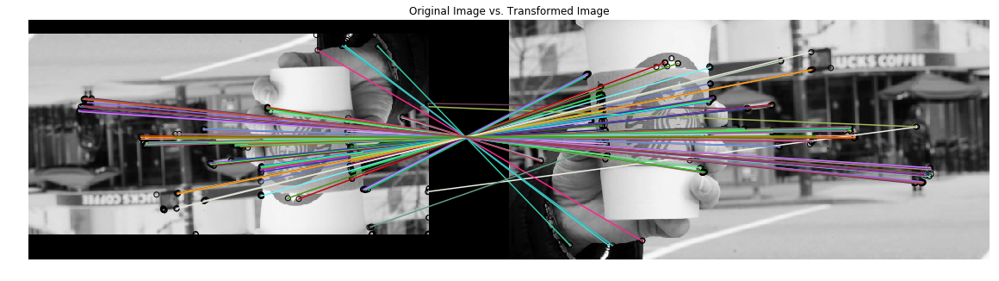

115


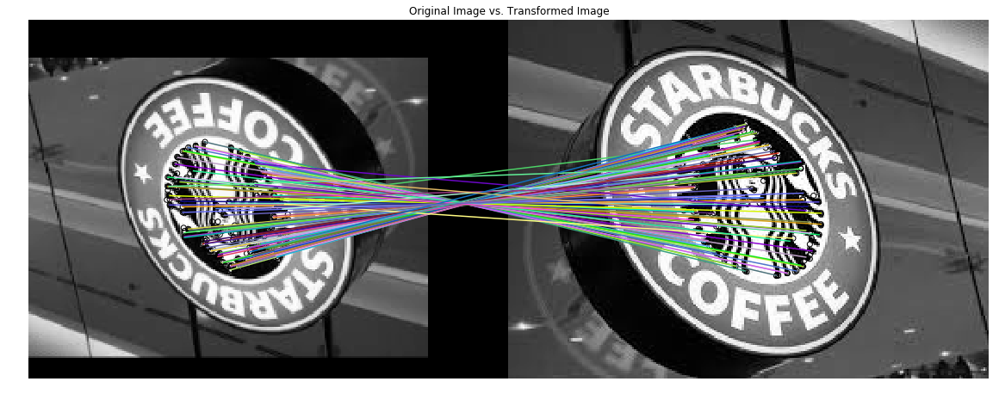

112


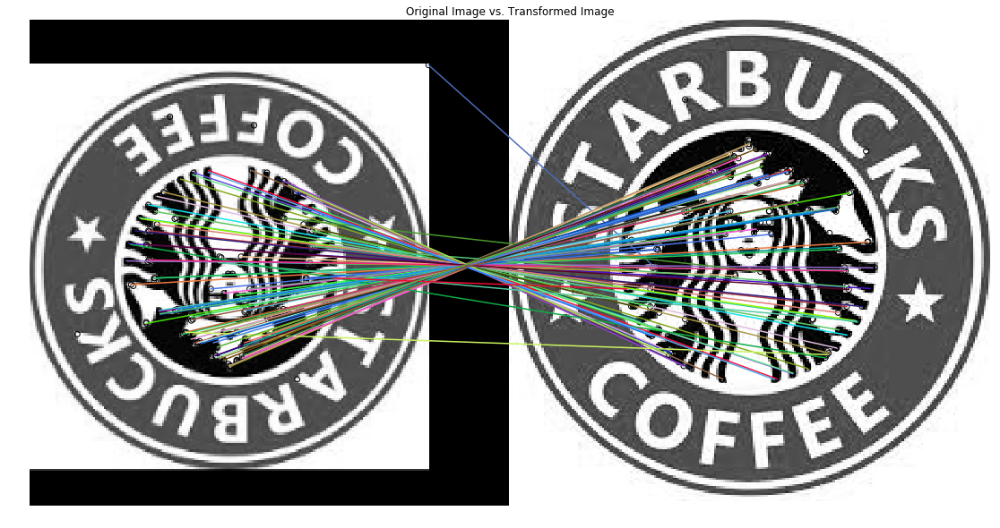

112


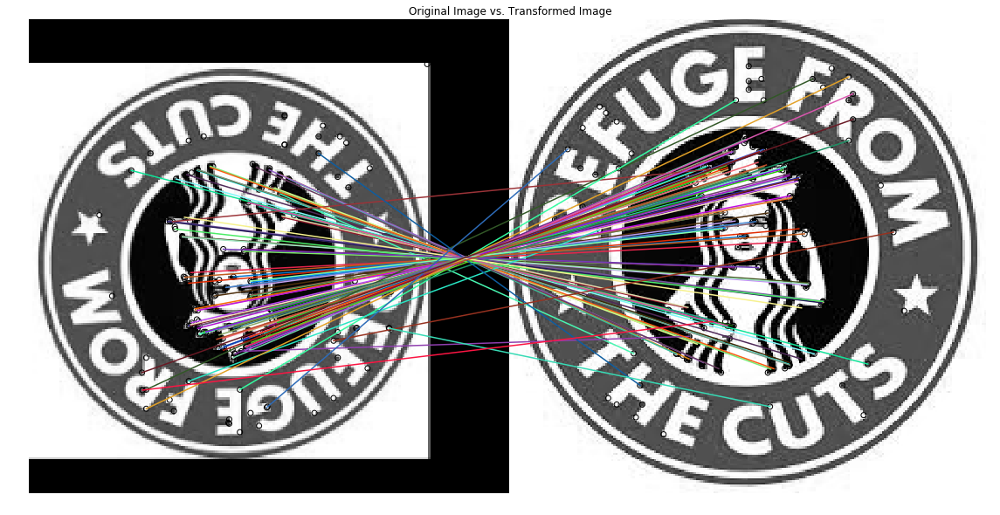

99


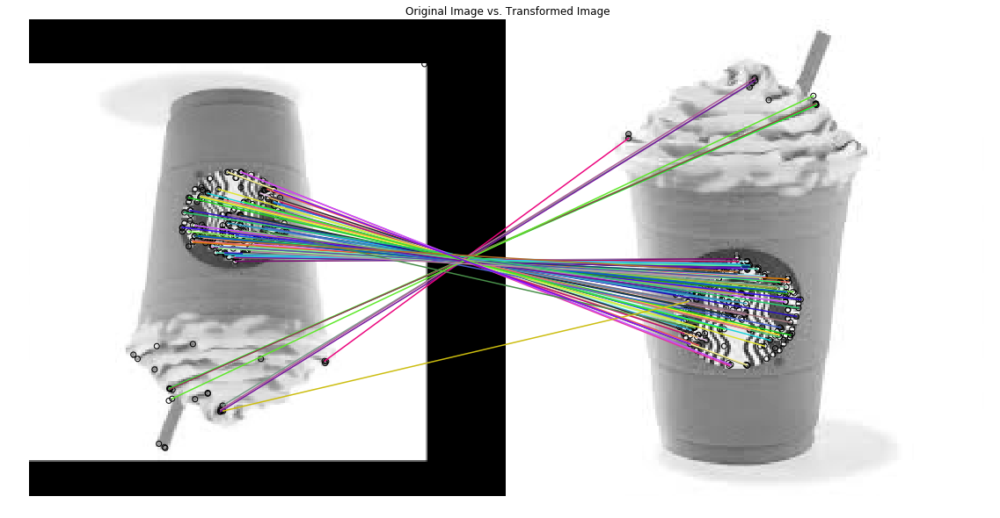

95


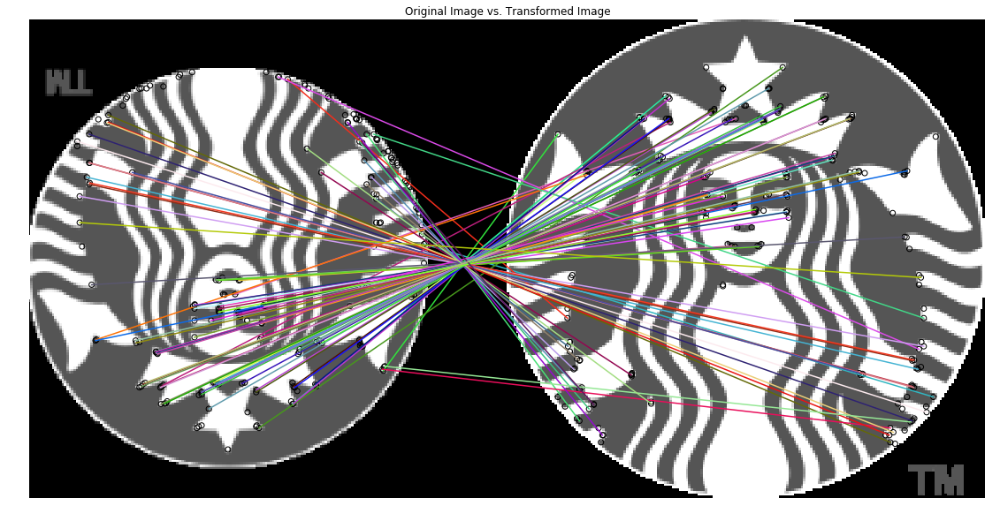

In [35]:
# we import the different images and transform them to grayscale
starbucks = io.imread('./images/starbucks.jpg')
starbucks_grayscale = rgb2gray(starbucks)

starbucks_2 = io.imread('./images/starbucks2.png')
starbucks_2_grayscale = rgb2gray(starbucks_2)

starbucks_4 = io.imread('./images/starbucks4.jpg')
starbucks_4_grayscale = rgb2gray(starbucks_4)

starbucks_5 = io.imread('./images/starbucks5.png')
starbucks_5_grayscale = rgb2gray(starbucks_5)

starbucks_6 = io.imread('./images/starbucks6.jpg')
starbucks_6_grayscale = rgb2gray(starbucks_6)

starbucks_cup = io.imread('./images/starbucksCup.jpg')
starbucks_cup_grayscale = rgb2gray(starbucks_cup)


# and we call to the orb function rotated scale, 
# the order of execution is sorted by the number of matched descriptors between the images
ORB_function_rotated_scale(starbucks_6_grayscale, starbucks_6_grayscale, 180, 1.2)
ORB_function_rotated_scale(starbucks_4_grayscale, starbucks_4_grayscale, 180, 1.2)
ORB_function_rotated_scale(starbucks_grayscale, starbucks_grayscale, 180, 1.2)
ORB_function_rotated_scale(starbucks_5_grayscale, starbucks_5_grayscale, 180, 1.2)
ORB_function_rotated_scale(starbucks_cup_grayscale, starbucks_cup_grayscale, 180, 1.2)
ORB_function_rotated_scale(starbucks_2_grayscale, starbucks_2_grayscale, 180, 1.2)

**Optional:** Repeate the experiment with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.



### Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

**The advantages of the ORB object detection respect to the HOG and template is that ORB is focused on the similarity between different points of the image(the corners) and the HOG and template is photometric deformation dependant, if the colors from the image or the template are not clear enough, it will have trouble looking for the similarities. Both of them are not dimensional deformation dependants.**

**Probably ORB will find a few similarities on the shapes of the image, but the quantity of matches will be lesser than the quantity you would get with an image with the starbucks logo.**

**A way to measure the quality of correspondance could be looking for the proportion of matches on the whole image. If there are different matches all across the image(this could mean that the similarity is everywhere on the image) we could say that the correspondance is better.**

## Delivery

All code sould be commented in English. Answers of the questions should be given in English too.

Compressed file **P4_Student1_Student2.zip** that includes:
- The notebook P1_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
- The images used that are not provided in P1.zip.

**Deadline (Campus Virtual): November 21st, 11:00 p.m.** 

In [29]:
#Appendix: In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)